# Import library and set necessary configuration

In [101]:
pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 7.6 MB/s 
     |████████████████████████████████| 6.3 MB 43.4 MB/s 
     |████████████████████████████████| 16.7 MB 481 kB/s 


In [151]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import geopandas as geopd

In [2]:
import yellowbrick
import matplotlib.pyplot as plt

from yellowbrick.classifier import ConfusionMatrix, ROCAUC, ClassificationReport
from yellowbrick.contrib.wrapper import wrap
from yellowbrick.style import set_palette

plt.rcParams['figure.dpi']=600

In [3]:
import plotly.io as pio

# Create a custom theme and set it as default
pio.templates["custom"] = pio.templates["plotly_white"]
pio.templates["custom"].layout.margin = {'b': 25, 'l': 25, 'r': 25, 't': 50}
pio.templates["custom"].layout.width = 600
pio.templates["custom"].layout.height = 450
pio.templates["custom"].layout.autosize = False
pio.templates["custom"].layout.font.family="Arial"
pio.templates["custom"].layout.title.update({"x":0.5, "xref":"paper", "font_family":"Arial", "font_size":16})
pio.templates["custom"].layout.xaxis.update({"showline":True, "linecolor":"darkgray",})
pio.templates["custom"].layout.yaxis.update({"showline":True, "linecolor":"darkgray",})
pio.templates["custom"].layout.colorway = ['#1F77B4', '#FF7F0E', '#54A24B', '#D62728', '#C355FA',
                                           '#8C564B', '#E377C2', '#7F7F7F',"#FFE323", '#17BECF']
pio.templates.default = "custom"

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Exploratory Data Analysis

In [97]:
geo_13 = pd.read_csv("/content/householdgeovariables_ihps_13.csv", index_col=0)
geo_16 = pd.read_csv("/content/householdgeovariablesihpsy3.csv", index_col=0)
geo_19 = pd.read_csv("/content/householdgeovariables_y4.csv", index_col=0)
geo_13.head()
geo_13_loc = geo_13[["LAT_DD_MOD", "LON_DD_MOD"]]
geo_16_loc = geo_16[['lat_modified', 'lon_modified']]
geo_19_loc = geo_19[['lat_mod', 'lon_mod']]

In [80]:
# final_13_x = pd.read_csv("/content/drive/MyDrive/final_13.csv", index_col=0)
# final_16_x = pd.read_csv("/content/drive/MyDrive/final_16.csv", index_col=0)
# final_19_x = pd.read_csv("/content/drive/MyDrive/final_19.csv", index_col=0)
final_13 = pd.read_csv("final_13 (1).csv", index_col=0)
final_16 = pd.read_csv("final_16 (1).csv", index_col=0)
final_19 = pd.read_csv("final_19 (1).csv", index_col=0)

In [124]:
merged_13 = final_13.merge(geo_13_loc, left_on="y2_hhid", right_index=True)
merged_16 = final_16.merge(geo_16_loc, left_on="y3_hhid", right_index=True)

In [125]:
merged_13.food_insecure = merged_13.food_insecure.astype('str')
merged_16.food_insecure = merged_16.food_insecure.astype('str')

In [131]:
merged_13.shape

(1984, 49)

In [132]:
fig = px.scatter_mapbox(merged_13,
                    lat="LAT_DD_MOD",
                    lon="LON_DD_MOD",
                    color='food_insecure',
                    height=800, width=1000)
fig.update_layout(mapbox_style="carto-positron", title="Food Insecure Household in Malawi, 2013 (n=1984)")

In [85]:
train_data = final_13.iloc[:, 2:]
train_data = train_data.append(final_16.iloc[:, 2:], ignore_index=True)
train_data = train_data.drop(columns=['fs_score', 'city_code'])

replacer = {"petrol_3m":"Petrol_MA3", "diesel_3m":"Diesel_MA3", "kerosene_3m":"Kerosene_MA3", "petrol_6m":"Petrol_MA6", "diesel_6m":"Diesel_MA6", "kerosene_6m":"Kerosene_MA6","petrol_12m":"Petrol_MA12","diesel_12m":"Diesel_MA12","kerosene_12m":"Kerosene_MA12"}

train_data = train_data.rename(columns=replacer)

In [88]:
fi = train_data.food_insecure.value_counts()
fi.index = ['Food Secure', 'Food Insecure']

In [178]:
fig = px.pie(names=fi.index, values=fi.values, title="<b>Household Food Security Classification (2013 and 2016)</b>", hole=.3)
fig.update_traces(textinfo='label+percent+value')
fig.update_layout(showlegend=False)
fig.update_traces(marker_colors=['#908269', '#434343'])
fig.show()

In [83]:
train_data['vehicle'] = train_data['motorcycle'] + train_data['car'] + train_data['lorry'] + train_data['minibus']
train_data = train_data.drop(columns=['motorcycle', 'car', 'lorry', 'minibus'])

def binarize(num):
    if num != 0:
        return 1
    else:
        return 0

train_data['vehicle'] = train_data['vehicle'].apply(binarize)

In [11]:
train_data = train_data[['rural', 'city_name', 'permanent_cons', 'elect', 'cellphone',
       'male_head', 'educ_mean', 'radio', 'tv', 'bicycle', 'bed',
       'refrigerator', 'fan', 'vehicle', 'cultivate_land', 'livestock',
       'food_insecure', 'Petrol_MA3', 'Diesel_MA3', 'Kerosene_MA3',
       'Petrol_MA6', 'Diesel_MA6', 'Kerosene_MA6', 'Petrol_MA12',
       'Diesel_MA12', 'Kerosene_MA12', 'Beans_MA3', 'Groundnuts_MA3',
       'Maize_MA3', 'Rice_MA3', 'Beans_MA6', 'Groundnuts_MA6', 'Maize_MA6',
       'Rice_MA6', 'Beans_MA12', 'Groundnuts_MA12', 'Maize_MA12', 'Rice_MA12']]

In [14]:
px.imshow(train_data.loc[:,:"food_insecure"].corr(), height=800, width=900, title="Correlation Heatmap Between Potential Features and Target")

In [15]:
train_data = train_data.drop(columns=['tv', 'refrigerator', 'fan', 'bicycle', 'cultivate_land', 'livestock'])

In [16]:
mean_comp = train_data.groupby("food_insecure").mean()
mean_comp

,rural,permanent_cons,elect,cellphone,male_head,educ_mean,radio,bed,vehicle,Petrol_MA3,Diesel_MA3,Kerosene_MA3,Petrol_MA6,Diesel_MA6,Kerosene_MA6,Petrol_MA12,Diesel_MA12,Kerosene_MA12,Beans_MA3,Groundnuts_MA3,Maize_MA3,Rice_MA3,Beans_MA6,Groundnuts_MA6,Maize_MA6,Rice_MA6,Beans_MA12,Groundnuts_MA12,Maize_MA12,Rice_MA12
food_insecure,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.679341,0.419051,0.232458,0.664837,0.798118,1.666812,0.500588,0.568013,0.074089,0.724954,0.704577,0.574920,0.725506,0.70507,0.580156,0.671675,0.658432,0.539057,0.578934,0.555230,0.163346,0.544227,0.560360,0.550217,0.163843,0.531886,0.530117,0.539568,0.149526,0.485999
1,0.791753,0.237113,0.063918,0.449485,0.706186,1.255024,0.356186,0.291753,0.013402,0.723533,0.703172,0.574292,0.724346,0.70392,0.579861,0.669640,0.656379,0.537834,0.564024,0.551032,0.163095,0.534697,0.550136,0.546288,0.164416,0.522970,0.520721,0.534418,0.149976,0.477438


In [17]:
fig = px.bar(mean_comp.loc[:,:'vehicle'].T, barmode="group", height=600, width=800, orientation='h', title='Mean of Features Based on Food Insecurity Classification')
fig.update_layout(yaxis_title=None, legend_traceorder="reversed", xaxis_title="Mean")

### Model Selection

In [18]:
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RepeatedKFold, cross_val_score
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

In [19]:
test_data = final_19.iloc[:, 2:]
test_data = test_data.drop(columns=["city_code","fs_score"])

test_data = test_data.rename(columns=replacer)
test_data['vehicle'] = test_data['motorcycle'] + test_data['car'] + test_data['lorry'] + test_data['minibus']
test_data = test_data.drop(columns=['motorcycle', 'car', 'lorry', 'minibus'])
test_data['vehicle'] = test_data['vehicle'].apply(binarize)

In [20]:
def performance_plot(model, model_name):
  labels = list(X_train.columns)

  fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))

  conf_matrix = ConfusionMatrix(model, ax=ax1, title=f'{model_name} Confusion Matrix')
  conf_matrix.fit(scaled_X_train, Y_train)
  conf_matrix.score(scaled_X_test, Y_test)
  conf_matrix.finalize()

  logrocauc = ROCAUC(model, classes=['False', 'True'], ax=ax2, title=f'{model_name} ROC AUC')
  logrocauc.fit(scaled_X_train, Y_train)
  logrocauc.score(scaled_X_test, Y_test)
  logrocauc.finalize();

  creport = ClassificationReport(model, ax=ax3, classes=['False', 'True'], title=f'{model_name} Report')
  creport.fit(scaled_X_train, Y_train)
  creport.score(scaled_X_test, Y_test)
  creport.finalize();
        
  plt.tight_layout();

In [21]:
X_train = train_data[['rural', 'permanent_cons', 'elect', 'cellphone', 'radio', 'male_head',
       'vehicle', 'bed','Petrol_MA3',
       'Diesel_MA3', 'Kerosene_MA3', 'Petrol_MA6', 'Diesel_MA6',
       'Kerosene_MA6', 'Petrol_MA12', 'Diesel_MA12', 'Kerosene_MA12',
       'Beans_MA3', 'Groundnuts_MA3', 'Maize_MA3', 'Rice_MA3', 'Beans_MA6',
       'Groundnuts_MA6', 'Maize_MA6', 'Rice_MA6', 'Beans_MA12',
       'Groundnuts_MA12', 'Maize_MA12', 'Rice_MA12', 'educ_mean']]
Y_train = train_data["food_insecure"]


X_test = test_data[['rural', 'permanent_cons', 'elect', 'cellphone', 'radio', 'male_head',
       'vehicle', 'bed', 'Petrol_MA3',
       'Diesel_MA3', 'Kerosene_MA3', 'Petrol_MA6', 'Diesel_MA6',
       'Kerosene_MA6', 'Petrol_MA12', 'Diesel_MA12', 'Kerosene_MA12',
       'Beans_MA3', 'Groundnuts_MA3', 'Maize_MA3', 'Rice_MA3', 'Beans_MA6',
       'Groundnuts_MA6', 'Maize_MA6', 'Rice_MA6', 'Beans_MA12',
       'Groundnuts_MA12', 'Maize_MA12', 'Rice_MA12', 'educ_mean']]
Y_test = test_data['food_insecure']

scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train.loc[:,'Petrol_MA3':])
scaled_X_train = np.concatenate([X_train.loc[:, :"bed"].values, scaled_X_train], axis=1)
scaled_X_test = scaler.transform(X_test.loc[:,'Petrol_MA3':])
scaled_X_test = np.concatenate([X_test.loc[:, :"bed"].values, scaled_X_test], axis=1)

In [ ]:
from sklearn.metrics import f1_score

xgb = XGBClassifier(random_state=42)
gnb = GaussianNB()
dtc = DecisionTreeClassifier(random_state=42)
knn = KNeighborsClassifier()


models_df = pd.DataFrame()
models_df['Model'] = ['XGBoost', 'Decision Tree', 'GaussianNB', 'KNeighbors']
models_df.index = [xgb, dtc, gnb, knn]

for model in models_df.index:
    model.fit(scaled_X_train, Y_train)
    Y_pred = model.predict(scaled_X_test)
    models_df.loc[model, 'f1_score'] = f1_score(Y_pred, Y_test)

In [ ]:
models_df.sort_values(by="f1_score", ascending=False)

,Model,f1_score
GaussianNB(),GaussianNB,0.673285
XGBClassifier(random_state=42),XGBoost,0.634670
DecisionTreeClassifier(random_state=42),Decision Tree,0.590332
KNeighborsClassifier(),KNeighbors,0.571429


In [22]:
xgb = XGBClassifier(random_state=42)
gnb = GaussianNB()

model = gnb
model.fit(scaled_X_train,Y_train)
Y_pred = model.predict(scaled_X_test)
print(classification_report(Y_test, Y_pred))
# plot_confusion_matrix(model, scaled_X_test, Y_test)

              precision    recall  f1-score   support

           0       0.75      0.52      0.62      1728
           1       0.58      0.80      0.67      1448

    accuracy                           0.65      3176
   macro avg       0.67      0.66      0.65      3176
weighted avg       0.68      0.65      0.64      3176



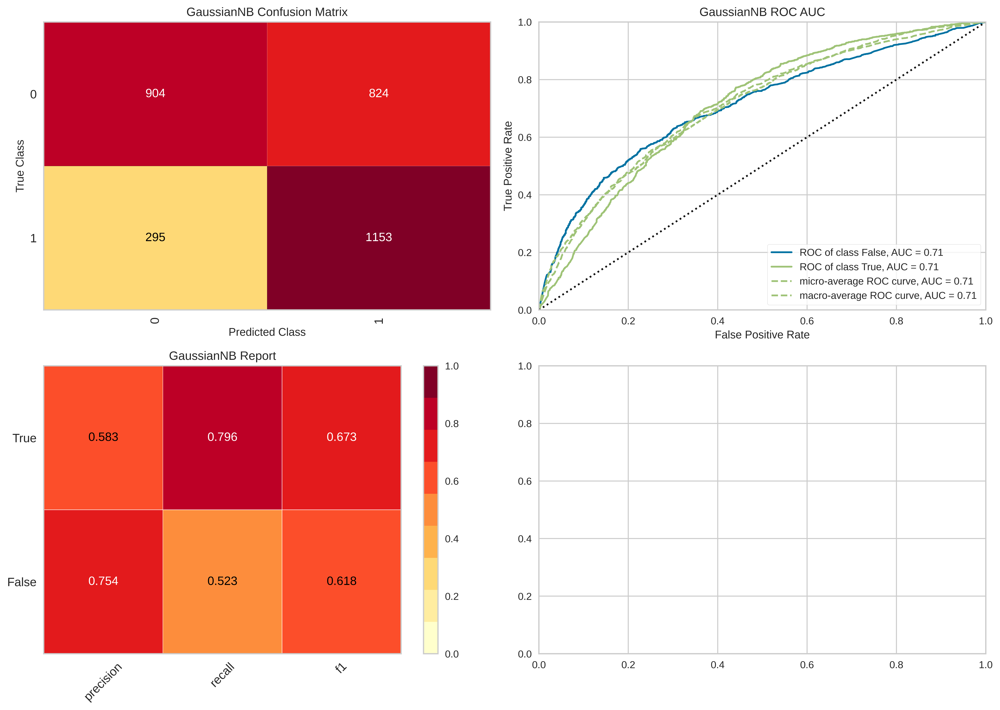

In [ ]:
performance_plot(model, 'GaussianNB')

In [23]:
xgb = XGBClassifier(random_state=42)
gnb = GaussianNB()

model = xgb
model.fit(scaled_X_train,Y_train)
Y_pred = model.predict(scaled_X_test)
print(classification_report(Y_test, Y_pred))
# plot_confusion_matrix(model, scaled_X_test, Y_test)

              precision    recall  f1-score   support

           0       0.70      0.59      0.64      1728
           1       0.58      0.69      0.63      1448

    accuracy                           0.64      3176
   macro avg       0.64      0.64      0.64      3176
weighted avg       0.65      0.64      0.64      3176



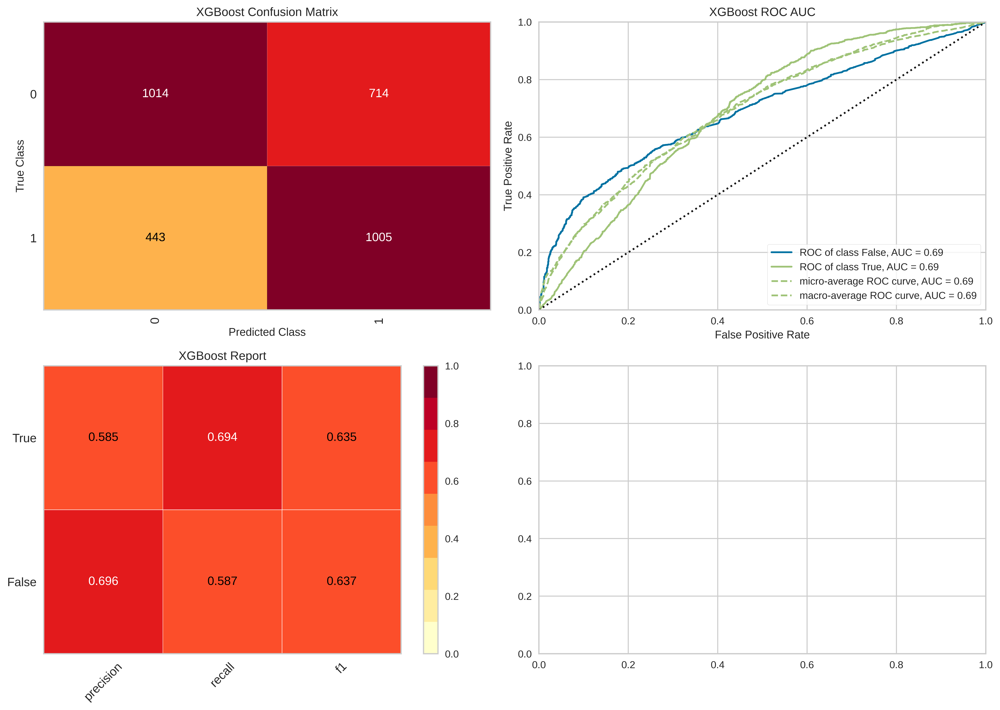

In [ ]:
performance_plot(model, 'XGBoost')

In [26]:
xgb = XGBClassifier(random_state=42)
xgb.fit(scaled_X_train,Y_train)
Y_pred_xgb = xgb.predict(scaled_X_test)
final_19["Y_pred_xgb"] = Y_pred_xgb

In [27]:
gnb = GaussianNB()
gnb.fit(scaled_X_train,Y_train)
Y_pred_gnb = gnb.predict(scaled_X_test)
final_19['Y_pred_gnb'] = Y_pred_gnb

In [37]:
final_19_mean = final_19.groupby("city_name").mean()
final_19_mean

,food_insecure,Y_pred_xgb,Y_pred_gnb
city_name,,,
Balaka,0.603960,0.673267,0.742574
Blantyre City,0.275000,0.250000,0.150000
Blanytyre,0.388235,0.529412,0.494118
Chikwawa,0.558824,0.705882,0.779412
Chiradzulu,0.381818,0.727273,0.781818
Chitipa,0.352941,0.274510,0.549020
Dedza,0.489474,0.789474,0.847368
Dowa,0.500000,0.783784,0.810811
Karonga,0.370370,0.240741,0.407407


In [33]:
!pip install pingouin
import pingouin as pg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 185 kB 7.9 MB/s 
     |████████████████████████████████| 9.9 MB 27.8 MB/s 
  Created wheel for pingouin: filename=pingouin-0.5.2-py3-none-any.whl size=196208 sha256=79e33cd695889a8ae9f239ec107acf0ed3ceb11f0620d09e56da1eb989d083c0
  Stored in directory: /root/.cache/pip/wheels/11/5a/63/a6d32fc26fa462c731f65480bfb98ff7bd39b8ebcb4bc6c2fe
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7049 sha256=d4dc6bce29601e8c0d538023419f17bdd6c065313928c4aab632ab3406f85825
  Stored in directory: /root/.cache/pip/wheels/d6/64/cd/32819b511a488e4993f2fab909a95330289c3f4e0f6ef4676d
Successfully built pingouin littleutils
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2


In [45]:
pg.corr(final_19_mean.food_insecure, final_19_mean.Y_pred_gnb, method="spearman")

,n,r,CI95%,p-val,power
spearman,31,0.541587,"[0.23, 0.75]",0.001652,0.901871


In [57]:
final_19_mean.shape

(31, 3)

In [60]:
final_19_mean.median()

food_insecure    0.461538
Y_pred_xgb       0.599448
Y_pred_gnb       0.700000
dtype: float64

In [77]:
fig = px.scatter(x=final_19_mean.food_insecure, y=final_19_mean.Y_pred_gnb, title="Proportion of Food Insecure Household for Each City", 
                 height=400, width=600, labels={"x":"Actual Value", "y":"Value Based on GNB Prediction"})
fig.add_vline(x=0.461538, line_width=1, line_dash="dash", line_color="red", annotation_text="Median",annotation_position="bottom right")
fig.add_hline(y=0.700000, line_width=1, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="top left")
fig.add_shape(type="rect",
    x0=0.461538, y0=0.7, x1=0.8, y1=0.95,
    fillcolor="lightsalmon",opacity=0.2, line_width=0
)
fig.show()

In [54]:
pg.corr(final_19_mean.food_insecure, final_19_mean.Y_pred_xgb, method="spearman")

,n,r,CI95%,p-val,power
spearman,31,0.408912,"[0.06, 0.67]",0.022368,0.644298


In [78]:
fig = px.scatter(x=final_19_mean.food_insecure, y=final_19_mean.Y_pred_xgb, title="Proportion of Food Insecure Household for Each City", 
                 height=400, width=600, labels={"x":"Actual Value", "y":"Value Based on XGB Prediction"})
fig.add_vline(x=0.461538, line_width=1, line_dash="dash", line_color="red", annotation_text="Median",annotation_position="bottom right")
fig.add_hline(y=0.599448, line_width=1, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="top left")
fig.add_shape(type="rect",
    x0=0.461538, y0=0.599448, x1=0.8, y1=0.9,
    fillcolor="lightsalmon",opacity=0.2, line_width=0
)
fig.show()

In [194]:
filename = "/content/malawi.geojson"
file = open(filename)
geo_df = geopd.read_file(file)
geo_df.head()

,id,OBJECTID,Admin2,NAME_2,geometry
0,mwi_bnd_admin2.1,1,19307,Dedza,"MULTIPOLYGON (((34.31365 -13.89768, 34.31343 -..."
1,mwi_bnd_admin2.2,2,19308,Dowa,"MULTIPOLYGON (((33.70203 -13.19699, 33.70242 -..."
2,mwi_bnd_admin2.3,3,19309,Kasungu,"MULTIPOLYGON (((33.60303 -12.37521, 33.60349 -..."
3,mwi_bnd_admin2.4,4,19310,Lilongwe,"MULTIPOLYGON (((33.41211 -13.48456, 33.41234 -..."
4,mwi_bnd_admin2.5,5,19311,Mchinji,"MULTIPOLYGON (((33.13470 -13.34451, 33.13513 -..."


In [195]:
geo_df['name'] = ['Dedza',
 'Dowa',
 'Kasungu',
 'Lilongwe City',
 'Mchinji',
 'Nkhota kota',
 'Ntchisi',
 'Salima',
 'Chitipa',
 'Karonga',
 'Rumphi',
 'Blanytyre',
 'Chikwawa',
 'Chiradzulu',
 'Nsanje',
 'Thyolo',
 'Zomba City',
 'Likoma',
 'Nkhatabay',
 'Balaka',
 'Machinga',
 'Phalombe',
 'Area under National Administration',
 'Neno',
 'Mulanje',
 'Ntcheu',
 'Mzimba',
 'Mangochi',
 'Mwanza']

In [196]:
lst = final_19_mean.index.unique()
for l in lst:
    if l not in geo_df["name"].values:
        print(l)

Blantyre City
Lilongwe
Mzuzu City
Zomba


In [221]:
ranked = final_19_mean.rank(ascending=False)
ranked

,food_insecure,Y_pred_xgb,Y_pred_gnb
city_name,,,
Balaka,3.0,14.0,14.0
Blantyre City,29.0,26.0,30.0
Blanytyre,23.0,18.0,25.0
Chikwawa,9.0,9.0,11.0
Chiradzulu,24.0,8.0,10.0
Chitipa,27.0,24.0,23.0
Dedza,14.0,3.0,3.0
Dowa,12.0,4.0,6.0
Karonga,26.0,27.0,26.0


In [214]:
fig = px.choropleth_mapbox(
    ranked,
    geojson=geo_df,
    featureidkey="properties.name",
    locations=final_19_mean.index,
    color="food_insecure",
    color_continuous_scale="rdbu_r",
    zoom=5.8,
    height=800,
    width=800,
    mapbox_style="carto-positron",
    center={
        "lon": sum(geo_df.total_bounds[[0, 2]]) / 2,
        "lat": (sum(geo_df.total_bounds[[1, 3]]) / 2) - 0.3,
    },
)
fig.update_layout(
    margin={"l": 0, "r": 0, "t": 50, "b": 20},
    title="<b>Actual Food Insecurity Ranking by City (2019)</b><br><i>Higher rank indicates higher food insecurity</i>",
    coloraxis_colorbar_title='Ranking'
)
fig.add_annotation(x=0, y=-0.025,
            text="Blantyre City, Lilongwe City, Mzuzu City, Zomba City are not shown in the map due to unavailable geojson data",
            showarrow=False, font_size=10,font_color='gray')
fig.show()

In [217]:
fig = px.choropleth_mapbox(
    ranked,
    geojson=geo_df,
    featureidkey="properties.name",
    locations=final_19_mean.index,
    color="Y_pred_gnb",
    color_continuous_scale="rdbu_r",
    zoom=5.8,
    height=800,
    width=800,
    mapbox_style="carto-positron",
    center={
        "lon": sum(geo_df.total_bounds[[0, 2]]) / 2,
        "lat": (sum(geo_df.total_bounds[[1, 3]]) / 2) - 0.3,
    },
)
fig.update_layout(
    margin={"l": 0, "r": 0, "t": 50, "b": 20},
    title="<b>Food Insecurity Ranking by City Based on GNB Prediction (2019)</b><br><i>Higher rank indicates higher food insecurity</i>",
    coloraxis_colorbar_title='Ranking'
)
fig.add_annotation(x=0, y=-0.025,
            text="Blantyre City, Lilongwe City, Mzuzu City, Zomba City are not shown in the map due to unavailable geojson data",
            showarrow=False, font_size=10,font_color='gray')
fig.show()

In [216]:
fig = px.choropleth_mapbox(
    ranked,
    geojson=geo_df,
    featureidkey="properties.name",
    locations=final_19_mean.index,
    color="Y_pred_xgb",
    color_continuous_scale="rdbu_r",
    zoom=5.8,
    height=800,
    width=800,
    mapbox_style="carto-positron",
    center={
        "lon": sum(geo_df.total_bounds[[0, 2]]) / 2,
        "lat": (sum(geo_df.total_bounds[[1, 3]]) / 2) - 0.3,
    },
)
fig.update_layout(
    margin={"l": 0, "r": 0, "t": 50, "b": 20},
    title="<b>Food Insecurity Ranking by City Based on XGB Prediction (2019)</b><br><i>Higher rank indicates higher food insecurity</i>",
    coloraxis_colorbar_title='Ranking'
)
fig.add_annotation(x=0, y=-0.025,
            text="Blantyre City, Lilongwe City, Mzuzu City, Zomba City are not shown in the map due to unavailable geojson data",
            showarrow=False, font_size=10,font_color='gray')
fig.show()